# Restaurant Revenue Regression

## Data fields

* Id : Restaurant id.
* Open Date : opening date for a restaurant
* City : City that the restaurant is in. Note that there are unicode in the names.
* City Group: Type of the city. Big cities, or Other.
* Type: Type of the restaurant. FC: Food Court, IL: Inline, DT: Drive Through, MB: Mobile
* P1, P2 - P37: There are three categories of these obfuscated data. Demographic data are gathered from third party providers with GIS systems. These include population in any given area, age and gender distribution, development scales. Real estate data mainly relate to the m2 of the location, front facade of the location, car park availability. Commercial data mainly include the existence of points of interest including schools, banks, other QSR operators.
* Revenue: The revenue column indicates a (transformed) revenue of the restaurant in a given year and is the target of predictive analysis. Please note that the values are transformed so they don't mean real dollar values.

## Import the libraries

In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
from sklearn import preprocessing
sns.set()


rcParams['font.family'] = 'comic sans ms'

When working with time series data, it's a good idea to make sure any date data is the format of a datetime object (a Python data type which encodes specific information about dates). We can see from the data dictionary that 'Open Date' is a date field.

## Importing the Data

In [2]:
data_train = pd.read_csv('data/train.csv', parse_dates=['Open Date'])
data_train.head()

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,0,1999-07-17,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,1,2008-02-14,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,2,2013-03-09,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,3,2012-02-02,Tokat,Other,IL,6,4.5,6.0,6.0,4,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,4,2009-05-09,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,...,3.0,5,1,3,2,3,4,3,3,4316715.0


In [3]:
data_test = pd.read_csv('data/test.csv', parse_dates=['Open Date'])
data_test.head()

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37
0,0,2011-01-22,Niğde,Other,FC,1,4.0,4.0,4.0,1,...,2.0,3.0,0,0,0,0,0,0,0,0
1,1,2011-03-18,Konya,Other,IL,3,4.0,4.0,4.0,2,...,1.0,3.0,0,0,0,0,0,0,0,0
2,2,2013-10-30,Ankara,Big Cities,FC,3,4.0,4.0,4.0,2,...,2.0,3.0,0,0,0,0,0,0,0,0
3,3,2013-05-06,Kocaeli,Other,IL,2,4.0,4.0,4.0,2,...,2.0,3.0,0,4,0,0,0,0,0,0
4,4,2013-07-31,Afyonkarahisar,Other,FC,2,4.0,4.0,4.0,1,...,5.0,3.0,0,0,0,0,0,0,0,0


In [4]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 43 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Id          137 non-null    int64         
 1   Open Date   137 non-null    datetime64[ns]
 2   City        137 non-null    object        
 3   City Group  137 non-null    object        
 4   Type        137 non-null    object        
 5   P1          137 non-null    int64         
 6   P2          137 non-null    float64       
 7   P3          137 non-null    float64       
 8   P4          137 non-null    float64       
 9   P5          137 non-null    int64         
 10  P6          137 non-null    int64         
 11  P7          137 non-null    int64         
 12  P8          137 non-null    int64         
 13  P9          137 non-null    int64         
 14  P10         137 non-null    int64         
 15  P11         137 non-null    int64         
 16  P12         137 non-null  

In [5]:
data_train.shape

(137, 43)

In [6]:
pd.set_option('display.max_columns', 50)

## Data Preprocessing

### Make a copy of the original DataFrame

Since we're going to be manipulating the data, we'll make a copy of the original DataFrame and perform our changes there.

This will keep the original DataFrame in tact if we need it again.

In [7]:
data_temp = data_train.copy()
data_temp.head()

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,0,1999-07-17,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,2,5,4,5,5,3,5,5.0,1,2,2,2,4,5,4,1,3,3,1,1,1.0,4.0,2.0,3.0,5,3,4,5,5,4,3,4,5653753.0
1,1,2008-02-14,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,2,5,5,5,5,1,5,5.0,0,0,0,0,0,3,2,1,3,2,0,0,0.0,0.0,3.0,3.0,0,0,0,0,0,0,0,0,6923131.0
2,2,2013-03-09,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,3,5,5,5,5,2,5,5.0,0,0,0,0,0,1,1,1,1,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2055379.0
3,3,2012-02-02,Tokat,Other,IL,6,4.5,6.0,6.0,4,4,10,8,10,10,8,10,7.5,6,4,9,3,12,20,12,6,1,10,2,2,2.5,2.5,2.5,7.5,25,12,10,6,18,12,12,6,2675511.0
4,4,2009-05-09,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,2,5,5,5,5,2,5,5.0,2,1,2,1,4,2,2,1,2,1,2,3,3.0,5.0,1.0,3.0,5,1,3,2,3,4,3,3,4316715.0


### Add datetime parameters for Open Date column

Why are we doing this?

So we can enrich our dataset with as much information as possible.

Because we imported the data using read_csv() and asked pandas to parse the dates using parase_dates=["Open Date"], we can now access the different datetime attributes of the open date column.

In [8]:
# adding datetime parameters for Open Date

data_temp['Open_Date_Year'] = data_temp['Open Date'].dt.year
data_temp['Open_Date_Month'] = data_temp['Open Date'].dt.month
data_temp['Open_Date_Day'] = data_temp['Open Date'].dt.day
data_temp.head()

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue,Open_Date_Year,Open_Date_Month,Open_Date_Day
0,0,1999-07-17,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,2,5,4,5,5,3,5,5.0,1,2,2,2,4,5,4,1,3,3,1,1,1.0,4.0,2.0,3.0,5,3,4,5,5,4,3,4,5653753.0,1999,7,17
1,1,2008-02-14,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,2,5,5,5,5,1,5,5.0,0,0,0,0,0,3,2,1,3,2,0,0,0.0,0.0,3.0,3.0,0,0,0,0,0,0,0,0,6923131.0,2008,2,14
2,2,2013-03-09,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,3,5,5,5,5,2,5,5.0,0,0,0,0,0,1,1,1,1,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2055379.0,2013,3,9
3,3,2012-02-02,Tokat,Other,IL,6,4.5,6.0,6.0,4,4,10,8,10,10,8,10,7.5,6,4,9,3,12,20,12,6,1,10,2,2,2.5,2.5,2.5,7.5,25,12,10,6,18,12,12,6,2675511.0,2012,2,2
4,4,2009-05-09,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,2,5,5,5,5,2,5,5.0,2,1,2,1,4,2,2,1,2,1,2,3,3.0,5.0,1.0,3.0,5,1,3,2,3,4,3,3,4316715.0,2009,5,9


In [9]:
# adding datetime parameters for Open Date

data_test['Open_Date_Year'] = data_test['Open Date'].dt.year
data_test['Open_Date_Month'] = data_test['Open Date'].dt.month
data_test['Open_Date_Day'] = data_test['Open Date'].dt.day
data_test.head()

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,Open_Date_Year,Open_Date_Month,Open_Date_Day
0,0,2011-01-22,Niğde,Other,FC,1,4.0,4.0,4.0,1,2,5,4,5,5,5,3,4.0,0,0,0,2,0,5,5,3,1,4,0,0,0.0,0.0,2.0,3.0,0,0,0,0,0,0,0,0,2011,1,22
1,1,2011-03-18,Konya,Other,IL,3,4.0,4.0,4.0,2,2,5,3,4,4,2,4,5.0,0,0,0,0,0,5,5,3,2,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2011,3,18
2,2,2013-10-30,Ankara,Big Cities,FC,3,4.0,4.0,4.0,2,2,5,4,4,5,4,5,5.0,0,0,0,0,0,5,5,5,5,5,0,0,0.0,0.0,2.0,3.0,0,0,0,0,0,0,0,0,2013,10,30
3,3,2013-05-06,Kocaeli,Other,IL,2,4.0,4.0,4.0,2,3,5,4,5,4,3,4,5.0,0,0,0,0,4,4,4,3,2,2,0,0,0.0,0.0,2.0,3.0,0,4,0,0,0,0,0,0,2013,5,6
4,4,2013-07-31,Afyonkarahisar,Other,FC,2,4.0,4.0,4.0,1,2,5,4,5,4,3,5,4.0,0,0,0,0,0,1,5,3,1,1,0,0,0.0,0.0,5.0,3.0,0,0,0,0,0,0,0,0,2013,7,31


### Dropping the unrequired features

We don't need the ID column, which is just a copyof the row index. Also we will drop the original Open Date column, now that we have enriched our dataset.

In [10]:
data_temp.drop(['Id','Open Date'], axis=1, inplace=True)
data_temp.head()

,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue,Open_Date_Year,Open_Date_Month,Open_Date_Day
0,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,2,5,4,5,5,3,5,5.0,1,2,2,2,4,5,4,1,3,3,1,1,1.0,4.0,2.0,3.0,5,3,4,5,5,4,3,4,5653753.0,1999,7,17
1,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,2,5,5,5,5,1,5,5.0,0,0,0,0,0,3,2,1,3,2,0,0,0.0,0.0,3.0,3.0,0,0,0,0,0,0,0,0,6923131.0,2008,2,14
2,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,3,5,5,5,5,2,5,5.0,0,0,0,0,0,1,1,1,1,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2055379.0,2013,3,9
3,Tokat,Other,IL,6,4.5,6.0,6.0,4,4,10,8,10,10,8,10,7.5,6,4,9,3,12,20,12,6,1,10,2,2,2.5,2.5,2.5,7.5,25,12,10,6,18,12,12,6,2675511.0,2012,2,2
4,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,2,5,5,5,5,2,5,5.0,2,1,2,1,4,2,2,1,2,1,2,3,3.0,5.0,1.0,3.0,5,1,3,2,3,4,3,3,4316715.0,2009,5,9


In [11]:
data_test.drop(['Id','Open Date'], axis=1, inplace=True)
data_test.head()

,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,Open_Date_Year,Open_Date_Month,Open_Date_Day
0,Niğde,Other,FC,1,4.0,4.0,4.0,1,2,5,4,5,5,5,3,4.0,0,0,0,2,0,5,5,3,1,4,0,0,0.0,0.0,2.0,3.0,0,0,0,0,0,0,0,0,2011,1,22
1,Konya,Other,IL,3,4.0,4.0,4.0,2,2,5,3,4,4,2,4,5.0,0,0,0,0,0,5,5,3,2,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2011,3,18
2,Ankara,Big Cities,FC,3,4.0,4.0,4.0,2,2,5,4,4,5,4,5,5.0,0,0,0,0,0,5,5,5,5,5,0,0,0.0,0.0,2.0,3.0,0,0,0,0,0,0,0,0,2013,10,30
3,Kocaeli,Other,IL,2,4.0,4.0,4.0,2,3,5,4,5,4,3,4,5.0,0,0,0,0,4,4,4,3,2,2,0,0,0.0,0.0,2.0,3.0,0,4,0,0,0,0,0,0,2013,5,6
4,Afyonkarahisar,Other,FC,2,4.0,4.0,4.0,1,2,5,4,5,4,3,5,4.0,0,0,0,0,0,1,5,3,1,1,0,0,0.0,0.0,5.0,3.0,0,0,0,0,0,0,0,0,2013,7,31


## Exploratory Data Analysis

In [12]:
! pip install dataprep

### Overall statistics

In [13]:
from dataprep.datasets import get_dataset_names
from dataprep.datasets import load_dataset
from dataprep.eda import create_report,plot,plot_missing
import scipy.stats as stats

In [14]:
# function for overall statistic report

def overall_stat(df):
    # display the overall stat report
    display(plot(df, display = ['Stats', 'Insights']))
    
    # display and store the numerical and non-numerical columns
    num_cols = list(df.select_dtypes(include=['number']).columns)
    cat_cols = list(df.select_dtypes(include=['object']).columns)
    
    print(f"Numerical Columns: {num_cols}")
    print(f"Categorical Columns: {cat_cols}")

  0%|                                                                                         | 0/1411 [00:00<…


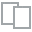
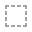
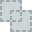
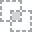
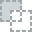
...
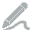
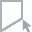
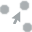
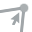
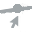

Numerical Columns: ['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13', 'P14', 'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23', 'P24', 'P25', 'P26', 'P27', 'P28', 'P29', 'P30', 'P31', 'P32', 'P33', 'P34', 'P35', 'P36', 'P37', 'revenue', 'Open_Date_Year', 'Open_Date_Month', 'Open_Date_Day']
Categorical Columns: ['City', 'City Group', 'Type']


In [15]:
overall_stat(data_temp)

**As can be seen above, for data_temp:**

* 137 rows
* no missing value
* 44 features, 1 target (numerical)

## Univariate Analysis

### Numerical Feature Univariate Analysis

In [16]:

# define the function for univariate analysis
def univariate_analysis_num(df, interested_features):
    display(plot(df, interested_features, display = ['Stats','KDE Plot', 'Normal Q-Q Plot', 'Box Plot']))
    skewness = df[interested_features].skew()
    kurtosis = df[interested_features].kurtosis()
    print(f"The skewness of {interested_features}: {skewness}")
          
    if(abs(skewness)) < 1:
          print(f"The {interested_features} distribution is nearly normal")
    elif(abs(skewness)) > 1:
          print(f"The {interested_features} distribution is positively skewed")
    else:
          print(f"The {interested_features} distribution is negatively skewed")
    print(f"The kurtosis: {kurtosis}")

D:\anaconda3\lib\site-packages\dask\utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)


  0%|                                                                                           | 0/83 [00:00<…

D:\anaconda3\lib\site-packages\dask\utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)



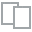
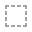
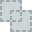
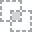
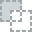
...
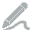
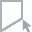
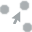
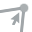
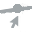

The skewness of revenue: 2.793478695162504
The revenue distribution is positively skewed
The kurtosis: 12.055176638707394


In [17]:
# define the interest feature you want to explore
interested_features='revenue'

univariate_analysis_num(data_temp, interested_features)

### Categorical Feature Univariate Analysis

In [18]:
def univariate_analysis_cat(df, interested_features):
    print(f"The non-numerical column you chose is: {interested_features}")
    display(plot(df, interested_features, display = ['Stats','Pie Chart', 'Value Table']))

In [19]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 44 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   City             137 non-null    object 
 1   City Group       137 non-null    object 
 2   Type             137 non-null    object 
 3   P1               137 non-null    int64  
 4   P2               137 non-null    float64
 5   P3               137 non-null    float64
 6   P4               137 non-null    float64
 7   P5               137 non-null    int64  
 8   P6               137 non-null    int64  
 9   P7               137 non-null    int64  
 10  P8               137 non-null    int64  
 11  P9               137 non-null    int64  
 12  P10              137 non-null    int64  
 13  P11              137 non-null    int64  
 14  P12              137 non-null    int64  
 15  P13              137 non-null    float64
 16  P14              137 non-null    int64  
 17  P15             

The non-numerical column you chose is: City


  0%|                                                                                           | 0/43 [00:00<…


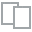
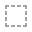
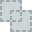
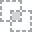
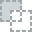
...
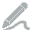
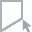
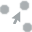
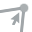
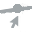

In [20]:
univariate_analysis_cat(data_temp, interested_features='City')

The non-numerical column you chose is: City Group


  0%|                                                                                           | 0/43 [00:00<…


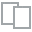
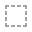
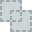
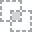
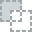
...
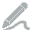
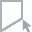
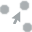
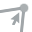
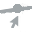

In [21]:
univariate_analysis_cat(data_temp, interested_features='City Group')

The non-numerical column you chose is: Type


  0%|                                                                                           | 0/43 [00:00<…


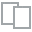
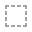
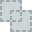
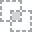
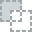
...
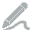
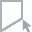
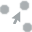
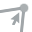
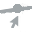

In [22]:
univariate_analysis_cat(data_temp, interested_features='Type')

## Bivariate Analysis

### Numerical - Numerical relationship

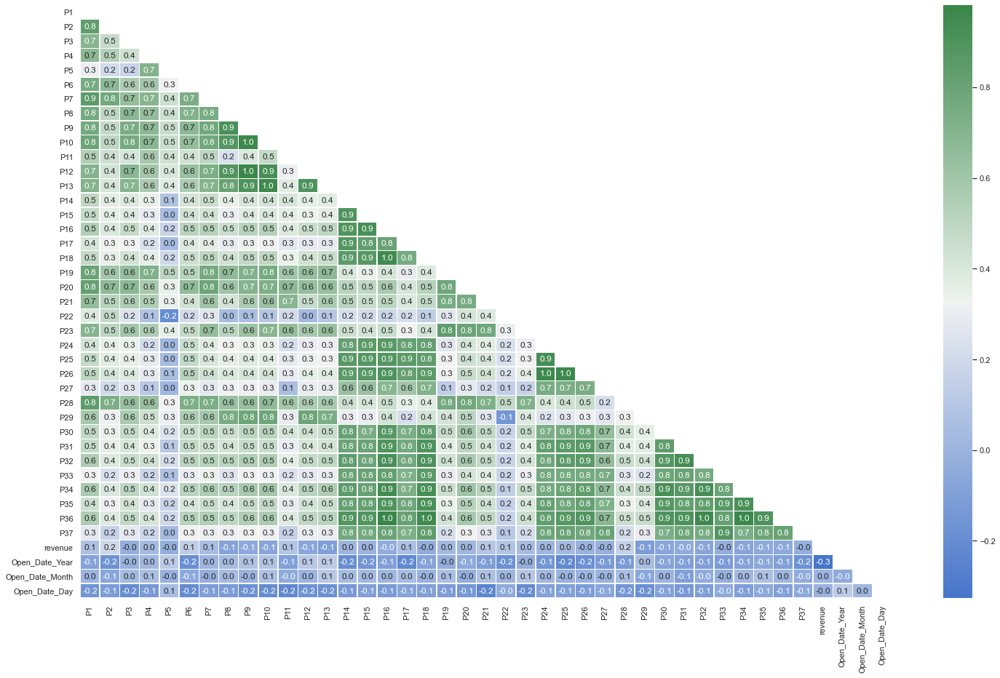

In [23]:
df_corr = data_temp.corr()
sns.set(style="white")

mask = np.zeros_like(df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(25, 15))

cmap = sns.diverging_palette(255, 133, as_cmap=True)

sns.heatmap(df_corr, mask=mask, cmap=cmap, linewidths=0.5, annot=True, fmt='.1f')

plt.yticks(rotation=0, ha="right")
plt.xticks(rotation=90, ha="center")
plt.show()

### Categorical - Numerical relationship (1 vs 1)

In [24]:
! pip install scikit-posthocs

In [25]:
# this is for the Kruskal test used for categorical-numerical relationship
import scikit_posthocs as sp 

In [40]:
data_temp.head()

,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue,Open_Date_Year,Open_Date_Month,Open_Date_Day
0,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,2,5,4,5,5,3,5,5.0,1,2,2,2,4,5,4,1,3,3,1,1,1.0,4.0,2.0,3.0,5,3,4,5,5,4,3,4,5653753.0,1999,7,17
1,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,2,5,5,5,5,1,5,5.0,0,0,0,0,0,3,2,1,3,2,0,0,0.0,0.0,3.0,3.0,0,0,0,0,0,0,0,0,6923131.0,2008,2,14
2,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,3,5,5,5,5,2,5,5.0,0,0,0,0,0,1,1,1,1,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2055379.0,2013,3,9
3,Tokat,Other,IL,6,4.5,6.0,6.0,4,4,10,8,10,10,8,10,7.5,6,4,9,3,12,20,12,6,1,10,2,2,2.5,2.5,2.5,7.5,25,12,10,6,18,12,12,6,2675511.0,2012,2,2
4,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,2,5,5,5,5,2,5,5.0,2,1,2,1,4,2,2,1,2,1,2,3,3.0,5.0,1.0,3.0,5,1,3,2,3,4,3,3,4316715.0,2009,5,9


In [41]:
# categorical-numerical relationship (cat_feature - target)

def cat_num_relationship(df, cat_col, num_col):
    
    # visualizing the graphs
    print(f"{cat_col} ------- {num_col} relationship: ")
    display(plot(df, num_col, cat_col))
    
    # hypothesis testing for catgorical-numerical relationship (Kruskal test)
    pc = sp.posthoc_conover(df, val_col=num_col, group_col=cat_col, p_adjust='holm')
    
    # arguments of the heatmap
    heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'square': True, 'cbar_ax_bbox': [0.80, 0.35, 0.04, 0.3]}
    
    # plotting
    fig, ax = plt.subplots(ncols=1, figsize = (15, 10))
    fig.suptitle("Significance plot", fontsize=18)
    sp.sign_plot(pc, **heatmap_args, ax=ax)
    fig.show()

City ------- revenue relationship: 


  0%|                                                                                           | 0/38 [00:00<…


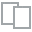
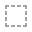
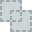
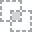
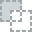
...
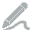
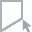
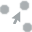
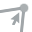
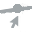

<ipython-input-41-773aa6a54d9b>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


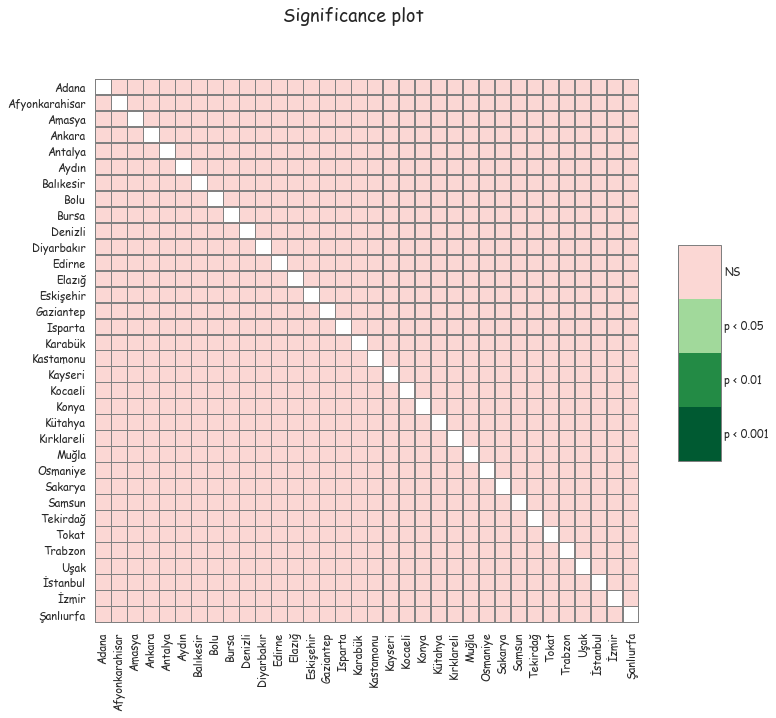

In [42]:
cat_num_relationship(data_temp, 'City', 'revenue')

City Group ------- revenue relationship: 


  0%|                                                                                           | 0/38 [00:00<…


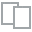
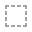
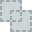
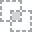
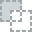
...
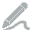
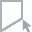
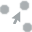
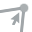
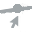

<ipython-input-41-773aa6a54d9b>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


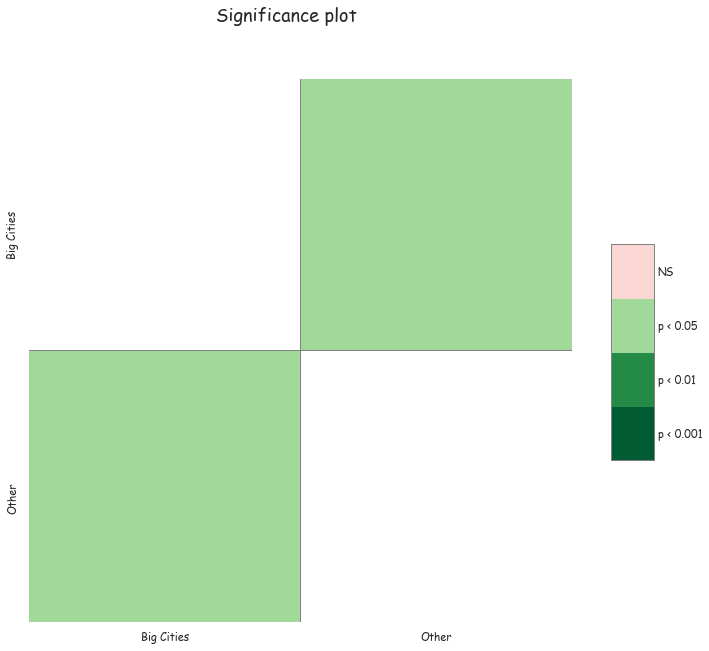

In [43]:
cat_num_relationship(data_temp, 'City Group', 'revenue')

Type ------- revenue relationship: 


  0%|                                                                                           | 0/38 [00:00<…


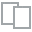
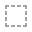
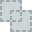
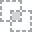
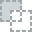
...
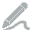
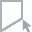
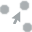
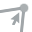
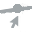

<ipython-input-41-773aa6a54d9b>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


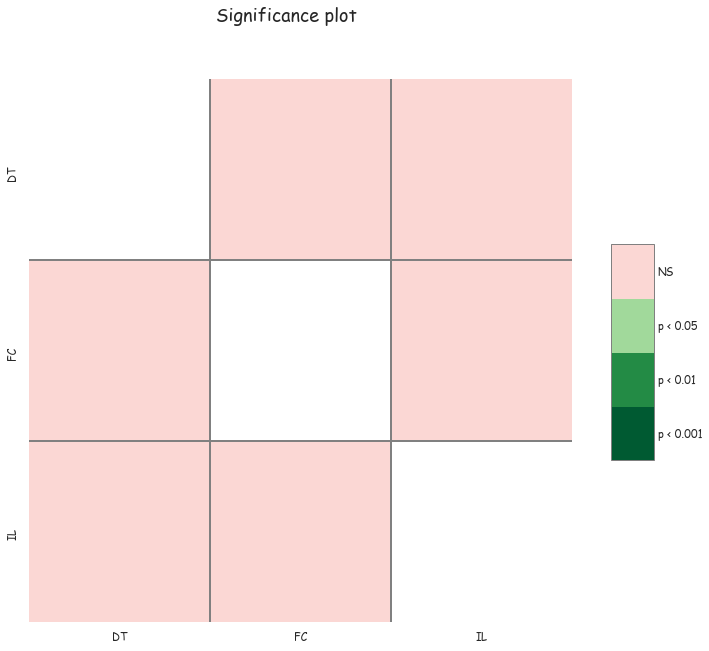

In [44]:
cat_num_relationship(data_temp, 'Type', 'revenue')

### Categorical-Categorical Relationship (1 vs 1)

In [45]:
from scipy.stats import chi2_contingency

In [46]:
# categorical - categorical relationship

def cat_cat_relationship(df, cat_col_1, cat_col_2):
    
    # visualization
    plot(df, cat_col_1, cat_col_2, display=['Stacked Bar Chart', 'Heat Map'])
    
    # chi-square test
    # 1st step: we convert the data into a contingency table with frequencies
    chi_contingency = pd.crosstab(df[cat_col_1], df[cat_col_2])
    print(f"chi2 - Contingency Table of selected columns: {cat_col_1} amd {cat_col_2}")
    display(chi_contingency)
    
    c, p, dof, expected = chi2_contingency(chi_contingency)
    if p< 0.05:
        print("Reject the null hypothesis")
        print(f'The:\n {cat_col_1}, {cat_col_2} are not independent\n')
    else:
        print("Fail to reject the null hypothesis")
        print(f'The:\n {cat_col_1}, {cat_col_2} are independent\n')
    print("The p-value: ", p)
    
    

In [47]:
cat_cat_relationship(data_temp, 'City', 'City Group')

chi2 - Contingency Table of selected columns: City amd City Group


City Group,Big Cities,Other
City,,
Adana,0,3
Afyonkarahisar,0,1
Amasya,0,1
Ankara,19,0
Antalya,0,4
Aydın,0,2
Balıkesir,0,1
Bolu,0,1
Bursa,0,5


Reject the null hypothesis
The:
 City, City Group are not independent

The p-value:  1.2531324153807798e-14


In [48]:
cat_cat_relationship(data_temp, 'City Group', 'Type')

chi2 - Contingency Table of selected columns: City Group amd Type


Type,DT,FC,IL
City Group,,,
Big Cities,1,39,38
Other,0,37,22


Fail to reject the null hypothesis
The:
 City Group, Type are independent

The p-value:  0.2545007604128446


## Encoding

In [53]:
data_temp.head()

,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue,Open_Date_Year,Open_Date_Month,Open_Date_Day
0,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,2,5,4,5,5,3,5,5.0,1,2,2,2,4,5,4,1,3,3,1,1,1.0,4.0,2.0,3.0,5,3,4,5,5,4,3,4,5653753.0,1999,7,17
1,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,2,5,5,5,5,1,5,5.0,0,0,0,0,0,3,2,1,3,2,0,0,0.0,0.0,3.0,3.0,0,0,0,0,0,0,0,0,6923131.0,2008,2,14
2,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,3,5,5,5,5,2,5,5.0,0,0,0,0,0,1,1,1,1,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2055379.0,2013,3,9
3,Tokat,Other,IL,6,4.5,6.0,6.0,4,4,10,8,10,10,8,10,7.5,6,4,9,3,12,20,12,6,1,10,2,2,2.5,2.5,2.5,7.5,25,12,10,6,18,12,12,6,2675511.0,2012,2,2
4,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,2,5,5,5,5,2,5,5.0,2,1,2,1,4,2,2,1,2,1,2,3,3.0,5.0,1.0,3.0,5,1,3,2,3,4,3,3,4316715.0,2009,5,9


In [54]:
data_test.head()

,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,Open_Date_Year,Open_Date_Month,Open_Date_Day
0,Niğde,Other,FC,1,4.0,4.0,4.0,1,2,5,4,5,5,5,3,4.0,0,0,0,2,0,5,5,3,1,4,0,0,0.0,0.0,2.0,3.0,0,0,0,0,0,0,0,0,2011,1,22
1,Konya,Other,IL,3,4.0,4.0,4.0,2,2,5,3,4,4,2,4,5.0,0,0,0,0,0,5,5,3,2,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2011,3,18
2,Ankara,Big Cities,FC,3,4.0,4.0,4.0,2,2,5,4,4,5,4,5,5.0,0,0,0,0,0,5,5,5,5,5,0,0,0.0,0.0,2.0,3.0,0,0,0,0,0,0,0,0,2013,10,30
3,Kocaeli,Other,IL,2,4.0,4.0,4.0,2,3,5,4,5,4,3,4,5.0,0,0,0,0,4,4,4,3,2,2,0,0,0.0,0.0,2.0,3.0,0,4,0,0,0,0,0,0,2013,5,6
4,Afyonkarahisar,Other,FC,2,4.0,4.0,4.0,1,2,5,4,5,4,3,5,4.0,0,0,0,0,0,1,5,3,1,1,0,0,0.0,0.0,5.0,3.0,0,0,0,0,0,0,0,0,2013,7,31


In [55]:
# define the function for label encoding and one-hot encoding

def label_encoding(df, cols):
    cols = cols
    le = preprocessing.LabelEncoder()
    df[cols] = le.fit_transform(df[cols])
    return df
    
def one_hot_encoding(df, cols):
    cols = cols
    df = pd.get_dummies(df, columns=cols)
    return df

In [71]:
# data_train_encode = label_encoding(data_temp, ['City'])
data_train_encode = one_hot_encoding(data_temp, ['City Group', 'Type'])

# data_test_encode = label_encoding(data_temp, 'City')
data_test_encode = one_hot_encoding(data_test, ['City Group', 'Type'])

In [72]:
le = preprocessing.LabelEncoder()
data_train_encode['City'] = le.fit_transform(data_train_encode['City'])
data_test_encode['City'] = le.fit_transform(data_test_encode['City'])

In [73]:
data_train_encode.head()

,City,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue,Open_Date_Year,Open_Date_Month,Open_Date_Day,City Group_Big Cities,City Group_Other,Type_DT,Type_FC,Type_IL
0,31,4,5.0,4.0,4.0,2,2,5,4,5,5,3,5,5.0,1,2,2,2,4,5,4,1,3,3,1,1,1.0,4.0,2.0,3.0,5,3,4,5,5,4,3,4,5653753.0,1999,7,17,1,0,0,0,1
1,3,4,5.0,4.0,4.0,1,2,5,5,5,5,1,5,5.0,0,0,0,0,0,3,2,1,3,2,0,0,0.0,0.0,3.0,3.0,0,0,0,0,0,0,0,0,6923131.0,2008,2,14,1,0,0,1,0
2,10,2,4.0,2.0,5.0,2,3,5,5,5,5,2,5,5.0,0,0,0,0,0,1,1,1,1,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2055379.0,2013,3,9,0,1,0,0,1
3,28,6,4.5,6.0,6.0,4,4,10,8,10,10,8,10,7.5,6,4,9,3,12,20,12,6,1,10,2,2,2.5,2.5,2.5,7.5,25,12,10,6,18,12,12,6,2675511.0,2012,2,2,0,1,0,0,1
4,14,3,4.0,3.0,4.0,2,2,5,5,5,5,2,5,5.0,2,1,2,1,4,2,2,1,2,1,2,3,3.0,5.0,1.0,3.0,5,1,3,2,3,4,3,3,4316715.0,2009,5,9,0,1,0,0,1


In [75]:
data_test_encode.head()

,City,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37,Open_Date_Year,Open_Date_Month,Open_Date_Day,City Group_Big Cities,City Group_Other,Type_DT,Type_FC,Type_IL,Type_MB
0,38,1,4.0,4.0,4.0,1,2,5,4,5,5,5,3,4.0,0,0,0,2,0,5,5,3,1,4,0,0,0.0,0.0,2.0,3.0,0,0,0,0,0,0,0,0,2011,1,22,0,1,0,1,0,0
1,27,3,4.0,4.0,4.0,2,2,5,3,4,4,2,4,5.0,0,0,0,0,0,5,5,3,2,1,0,0,0.0,0.0,1.0,3.0,0,0,0,0,0,0,0,0,2011,3,18,0,1,0,0,1,0
2,3,3,4.0,4.0,4.0,2,2,5,4,4,5,4,5,5.0,0,0,0,0,0,5,5,5,5,5,0,0,0.0,0.0,2.0,3.0,0,0,0,0,0,0,0,0,2013,10,30,1,0,0,1,0,0
3,26,2,4.0,4.0,4.0,2,3,5,4,5,4,3,4,5.0,0,0,0,0,4,4,4,3,2,2,0,0,0.0,0.0,2.0,3.0,0,4,0,0,0,0,0,0,2013,5,6,0,1,0,0,1,0
4,1,2,4.0,4.0,4.0,1,2,5,4,5,4,3,5,4.0,0,0,0,0,0,1,5,3,1,1,0,0,0.0,0.0,5.0,3.0,0,0,0,0,0,0,0,0,2013,7,31,0,1,0,1,0,0


In [80]:
data_test_encode['Type_MB'].value_counts()

0    99710
1      290
Name: Type_MB, dtype: int64

## Feature Selection

In [68]:
from sklearn.linear_model import LassoCV, Lasso
from sklearn.feature_selection import RFECV
from sklearn.metrics import mean_squared_error, roc_auc_score

### Selecting the dependent and the independent features

In [81]:
x_train = data_train_encode.drop('revenue', axis=1)
y_train = data_train_encode['revenue']

x_test = data_test_encode.drop('Type_MB', axis=1)

In [82]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()

x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [85]:
model = Lasso()
feature_selector = RFECV(model,
                        cv=5,
                        verbose=True,
                        n_jobs=-1,
                         min_features_to_select= 20,
                        scoring='neg_mean_squared_error')

feature_selector.fit(x_train_scaled, y_train)

Fitting estimator with 46 features.
Fitting estimator with 45 features.
Fitting estimator with 44 features.
Fitting estimator with 43 features.
Fitting estimator with 42 features.
Fitting estimator with 41 features.
Fitting estimator with 40 features.
Fitting estimator with 39 features.
Fitting estimator with 38 features.
Fitting estimator with 37 features.
Fitting estimator with 36 features.
Fitting estimator with 35 features.
Fitting estimator with 34 features.
Fitting estimator with 33 features.
Fitting estimator with 32 features.


D:\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 263952934146221.78, tolerance: 90251570180.51764
  model = cd_fast.enet_coordinate_descent(
D:\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 263952934146166.0, tolerance: 90251570180.51764
  model = cd_fast.enet_coordinate_descent(
D:\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 263600279509570.78, tolerance: 90251570180.51764
  model = cd_fast.enet_coordinate_descent(
D:\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want 

Fitting estimator with 31 features.
Fitting estimator with 30 features.
Fitting estimator with 29 features.
Fitting estimator with 28 features.
Fitting estimator with 27 features.
Fitting estimator with 26 features.
Fitting estimator with 25 features.
Fitting estimator with 24 features.
Fitting estimator with 23 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.


D:\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14736517962500.375, tolerance: 90251570180.51764
  model = cd_fast.enet_coordinate_descent(
D:\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10918788798372.562, tolerance: 90251570180.51764
  model = cd_fast.enet_coordinate_descent(
D:\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 202294362529.3125, tolerance: 90251570180.51764
  model = cd_fast.enet_coordinate_descent(
D:\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want 

RFECV(cv=5, estimator=Lasso(), min_features_to_select=20, n_jobs=-1,
      scoring='neg_mean_squared_error', verbose=True)

In [86]:
feature_selector.n_features_

20

In [90]:
# length check
len(feature_selector.support_)==len(x_train.columns)

# store the selected features
select_features_df = pd.DataFrame({  'feature': x_train.columns,
                                    'tf': feature_selector.support_
                                 })

select_features_df

,feature,tf
0,City,True
1,P1,False
2,P2,False
3,P3,False
4,P4,False
5,P5,False
6,P6,True
7,P7,False
8,P8,True
9,P9,True


In [91]:
selected_feature = list(select_features_df.loc[select_features_df['tf'] == True]['feature'])
selected_feature

['City',
 'P6',
 'P8',
 'P9',
 'P10',
 'P15',
 'P18',
 'P20',
 'P23',
 'P25',
 'P26',
 'P28',
 'P32',
 'P34',
 'P35',
 'P36',
 'P37',
 'Open_Date_Year',
 'Type_DT',
 'Type_FC']

In [93]:
feature_coef = feature_selector.estimator_.coef_
len(feature_coef)

20

### Visualize the selected feature and coefficient

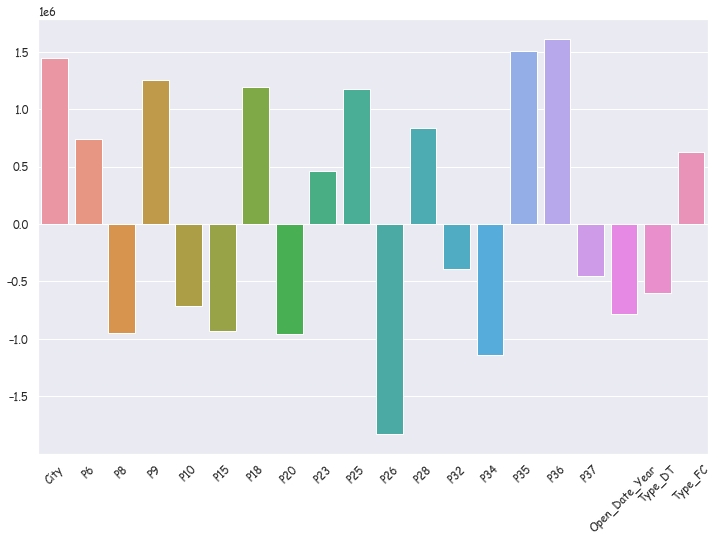

Selected features are: ['City', 'P6', 'P8', 'P9', 'P10', 'P15', 'P18', 'P20', 'P23', 'P25', 'P26', 'P28', 'P32', 'P34', 'P35', 'P36', 'P37', 'Open_Date_Year', 'Type_DT', 'Type_FC']


In [97]:
plt.figure(figsize=(12,8))
sns.barplot(x = selected_feature, y = feature_coef)
plt.xticks(rotation=45, ha="center")
plt.show()

print(f'Selected features are: {selected_feature}')

### Visualizing the RMSE of selected features

D:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


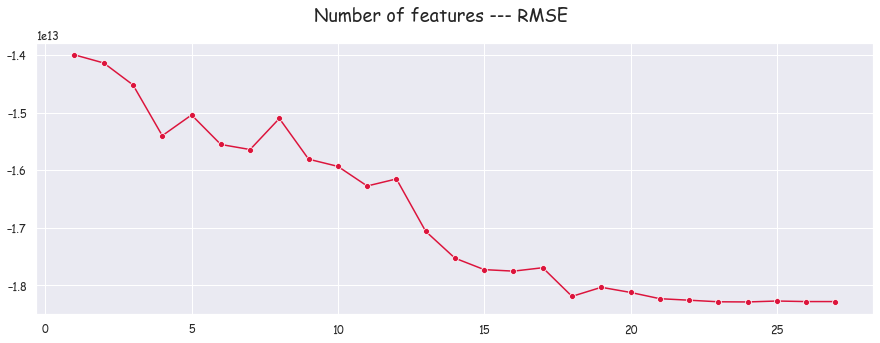

In [102]:
fig, ax=plt.subplots(ncols=1, figsize=(15,5))
fig.suptitle('Number of features --- RMSE', fontsize = 18)
sns.lineplot(range(1,len(feature_selector.grid_scores_)+1),
             feature_selector.grid_scores_,
             marker='o',
             color = 'crimson',
             ax=ax)
plt.show()

In [100]:
feature_selector.grid_scores_ 

array([-1.39992039e+13, -1.41402060e+13, -1.45211485e+13, -1.54017013e+13,
       -1.50419349e+13, -1.55542981e+13, -1.56420822e+13, -1.51027200e+13,
       -1.58094830e+13, -1.59345001e+13, -1.62745841e+13, -1.61523294e+13,
       -1.70611084e+13, -1.75267587e+13, -1.77257693e+13, -1.77520016e+13,
       -1.76927851e+13, -1.81898385e+13, -1.80323709e+13, -1.81215121e+13,
       -1.82299645e+13, -1.82563119e+13, -1.82838620e+13, -1.82865735e+13,
       -1.82705692e+13, -1.82799921e+13, -1.82799921e+13])

## Modelling


* Regularization method (Lasso, Ridge, Elastic Net)
* Tree based model (XGBoost etc)



In [103]:
# select the features from the dataset (20 features)

x_train_selected_features = x_train[selected_feature]
x_test_selected_features = x_test[selected_feature]

In [104]:
x_train_selected_features.head()

,City,P6,P8,P9,P10,P15,P18,P20,P23,P25,P26,P28,P32,P34,P35,P36,P37,Open_Date_Year,Type_DT,Type_FC
0,31,2,4,5,5,2,4,4,3,1,1.0,2.0,4,5,4,3,4,1999,0,0
1,3,2,5,5,5,0,0,2,2,0,0.0,3.0,0,0,0,0,0,2008,0,1
2,10,3,5,5,5,0,0,1,1,0,0.0,1.0,0,0,0,0,0,2013,0,0
3,28,4,8,10,10,4,12,12,10,2,2.5,2.5,10,18,12,12,6,2012,0,0
4,14,2,5,5,5,1,4,2,1,3,3.0,1.0,3,3,4,3,3,2009,0,0


In [105]:
x_test_selected_features.head()

,City,P6,P8,P9,P10,P15,P18,P20,P23,P25,P26,P28,P32,P34,P35,P36,P37,Open_Date_Year,Type_DT,Type_FC
0,38,2,4,5,5,0,0,5,4,0,0.0,2.0,0,0,0,0,0,2011,0,1
1,27,2,3,4,4,0,0,5,1,0,0.0,1.0,0,0,0,0,0,2011,0,0
2,3,2,4,4,5,0,0,5,5,0,0.0,2.0,0,0,0,0,0,2013,0,1
3,26,3,4,5,4,0,4,4,2,0,0.0,2.0,0,0,0,0,0,2013,0,0
4,1,2,4,5,4,0,0,5,1,0,0.0,5.0,0,0,0,0,0,2013,0,1


In [106]:
x_train_selected_features_scaled = scaler.fit_transform(x_train_selected_features)
x_test_selected_features_scaled = scaler.transform(x_test_selected_features)

In [109]:
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import ElasticNetCV
import lightgbm as lgb
import xgboost as xgb

from sklearn.metrics import mean_squared_error


### Fitting the Models

In [113]:
lassoCV = LassoCV(cv=5, n_jobs= -1)
lassoCV = lassoCV.fit(x_train_selected_features_scaled, y_train)

In [114]:
ridgeCV = RidgeCV(cv=5)
ridgeCV = ridgeCV.fit(x_train_selected_features_scaled, y_train)

In [115]:
elasticnetCV = ElasticNetCV(cv=5, n_jobs= -1)
elasticnetCV = elasticnetCV.fit(x_train_selected_features_scaled, y_train)

In [116]:
lightgbm = lgb.LGBMRegressor()
lightgbm = lightgbm.fit(x_train_selected_features_scaled, y_train)

In [117]:
xgboost = xgb.XGBRegressor(n_jobs = -1)
xgboost = xgboost.fit(x_train_selected_features_scaled, y_train)

### Generate predictions for training dataset

In [118]:
lasso_train_pred = lassoCV.predict(x_train_selected_features_scaled)
ridge_train_pred = ridgeCV.predict(x_train_selected_features_scaled)
elasticnet_train_pred = elasticnetCV.predict(x_train_selected_features_scaled)
lightgbm_train_pred = lightgbm.predict(x_train_selected_features_scaled)
xgboost_train_pred = xgboost.predict(x_train_selected_features_scaled)

### Generate RMSE for each model

In [119]:
lasso_RMSE = np.sqrt(mean_squared_error(y_train, lasso_train_pred))
ridge_RMSE = np.sqrt(mean_squared_error(y_train, ridge_train_pred))
elasticnet_RMSE = np.sqrt(mean_squared_error(y_train, elasticnet_train_pred))
lgb_RMSE = np.sqrt(mean_squared_error(y_train, lightgbm_train_pred))
xgb_RMSE = np.sqrt(mean_squared_error(y_train, xgboost_train_pred))

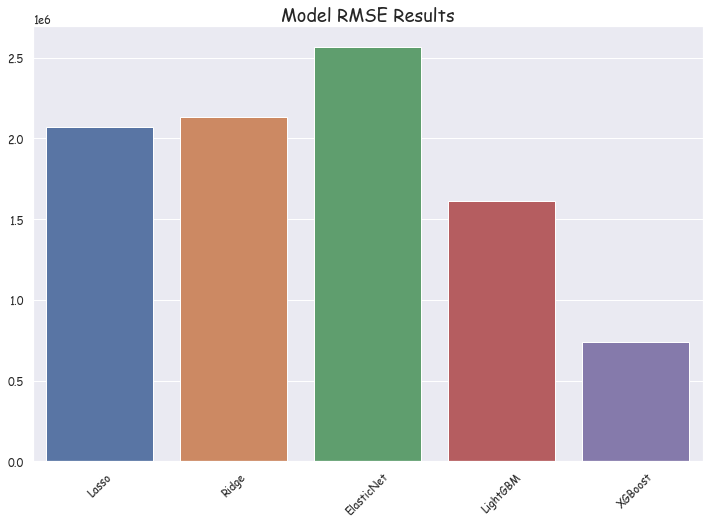

In [121]:
model_list = ['Lasso', 'Ridge', 'ElasticNet', 'LightGBM', 'XGBoost']
rmse_list = [lasso_RMSE, ridge_RMSE, elasticnet_RMSE, lgb_RMSE, xgb_RMSE]

plt.figure(figsize=(12,8))
sns.barplot(x = model_list, y = rmse_list)
plt.xticks(rotation=45, ha="center")
plt.title("Model RMSE Results", fontsize=18)
plt.show()

In [126]:
# print the result RMSE number
print(f' Lasso = {lasso_RMSE} \n Ridge = {ridge_RMSE}\n Elastic_Net = {elasticnet_RMSE}\n LGBM = {lgb_RMSE}\n XGBoost = {xgb_RMSE}\n')

 Lasso = 2072839.1645004838 
 Ridge = 2131809.5035584937
 Elastic_Net = 2565822.115732692
 LGBM = 1610027.2000601056
 XGBoost = 737140.834483027



As we can see from the above barplot, xgboost has the least RMSE. So we pick the xgboost model as the final model for our predictions.

## Generating predictions for test data

In [127]:
# generate prediction for test dataset

xgb_test_pred=xgboost.predict(x_test_selected_features_scaled)

In [129]:
# store the result

submission_df=pd.DataFrame(
                        {'Id': data_test.index,
                        'Prediction':xgb_test_pred}
                            )
submission_df

,Id,Prediction
0,0,4778167.00
1,1,2313742.50
2,2,4152275.50
3,3,2599480.00
4,4,2580766.25
...,...,...
99995,99995,3705341.75
99996,99996,2996757.25
99997,99997,4850639.50
99998,99998,3275959.75


In [130]:
submission_df.to_csv('data/submission_file.csv',index=False)